In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange
from matplotlib.patches import Patch

sc.settings.verbosity = 3

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import scanorama
import utils as my_utils

In [4]:
experiment = "Tonsil"
cores=['DonorA', 'DonorE']
datasets = [f'{core}_{i}' for core in cores for i in range(1,7)]

# Load data

In [5]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [6]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [7]:
adatas = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    adatas.append(adata)
adata = ad.concat(adatas, join="inner")

Sucessfully read dataset DonorA_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorA_2
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorA_3
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorA_4
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorA_5
normalizing counts per cell
    finished (0:00:00)
DonorA_6 cannot be read


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_2
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_3
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_4
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_5
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorE_6
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 70000)].index.tolist()

In [9]:
len(mz_qc)

146

In [10]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}_GC.h5ad"
adata_IMC_cluster = ad.read_h5ad(path)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [11]:
adata = adata[:, mz_qc]

## Get literature lut

In [12]:
SIMS_masses = adata.var_names

In [13]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

In [14]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)

SIMS_nm_subset = SIMS_masses_subset + 'm/z ' + SIMS_name_subset

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 145


In [15]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Load IMC

## Create Neighbor graph

In [16]:
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from sklearn.cluster import MiniBatchKMeans
from matplotlib.ticker import MaxNLocator
from skimage import morphology, measure, exposure
from scipy import ndimage


def get_NN(adata, n):
    data = adata.obsm["spatial"]
    # fit = NearestNeighbors(n_neighbors=n + 1).fit(data)
    fit = NearestNeighbors(n_neighbors=n).fit(data)
    m = fit.kneighbors(data)
    # m = m[0][:, 1:], m[1][:, 1:]
    m = m[0], m[1] # Distances, Indices

    # sort_neighbors
    args = m[0].argsort(axis=1)
    add = (
        np.arange(m[1].shape[0]) * m[1].shape[1]
    )  # arange for number of elements with step of number of neighbors
    sorted_indices = m[1].flatten()[
        args + add[:, None]
    ]  # Extract indices in sorted order
    return sorted_indices


def neighbor_frequency(adata, n):
    dummies = pd.get_dummies(adata.obs["leiden"]).values
    cols = get_NN(adata, n)
    window = dummies[cols].flatten()
    window = window.reshape(-1, n, dummies.shape[1])
    window = window.sum(axis=1) / n
    assert len(window) == len(adata.X)
    return window

In [17]:
n_neighbors = 20
windows = []

for d in adata_IMC_cluster.obs.Core.unique():
    adata_subset = adata_IMC_cluster[adata_IMC_cluster.obs.Core == d, :]

    # sq.gr.spatial_neighbors(adata_subset, n_neighs=n_neighbors)
    window = neighbor_frequency(adata_subset, n_neighbors)
    assert len(window) == len(adata_subset.X)

    windows.append(window)

windows = np.concatenate(windows)
windows.shape

(31156, 10)

In [18]:
adata_CN = ad.AnnData(windows)
adata_CN.raw = adata_IMC_cluster.copy()
adata_CN.obs = adata_IMC_cluster.obs.copy()
adata_CN.uns = adata_IMC_cluster.uns.copy()
adata_CN.obsm = adata_IMC_cluster.obsm.copy()
adata_CN.obsp = adata_IMC_cluster.obsp.copy() 
adata_CN.var_names = pd.get_dummies(adata_IMC_cluster.obs["leiden"]).columns.to_list()

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2906281834.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_CN = ad.AnnData(windows)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


computing PCA
    with n_comps=5
    finished (0:00:00)


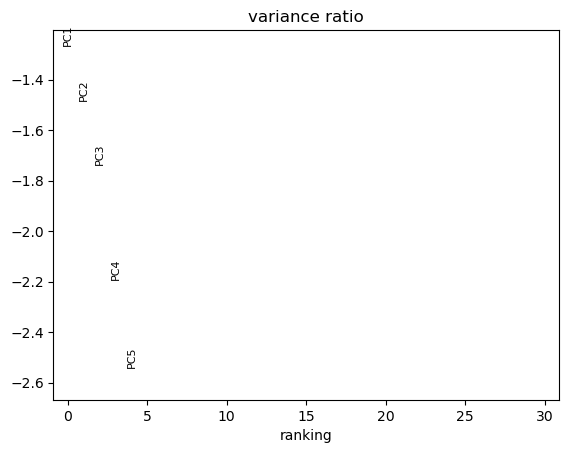

In [19]:
sc.tl.pca(adata_CN, n_comps=5)
sc.pl.pca_variance_ratio(adata_CN, log=True)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable 

The suggested number of clusters =  6


C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\406897452.py:30: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.title("The suggested number of clusters = " + np.str(kneedle_point.knee))


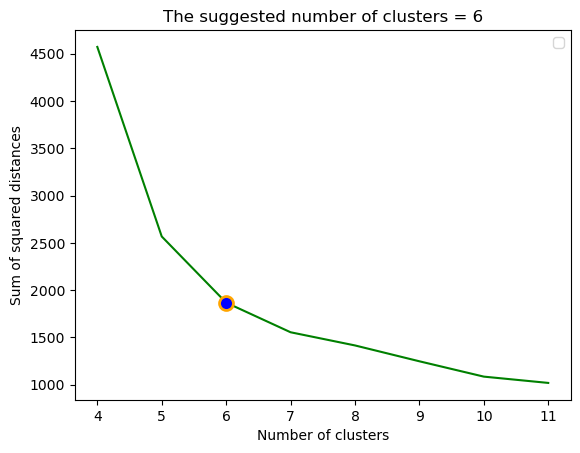

In [20]:
proj_3d = adata_CN.obsm['X_pca']

n_components = np.arange(4, 12)
models = [
    MiniBatchKMeans(random_state=5, n_clusters=n).fit(proj_3d) for n in n_components
]

BIC_Scores = [m.inertia_ for m in models]
kneedle_point = KneeLocator(
    n_components, BIC_Scores, curve="convex", direction="decreasing"
)
print("The suggested number of clusters = ", kneedle_point.knee)
Elbow_idx = np.where(BIC_Scores == kneedle_point.knee_y)[0]

plt.plot(
    n_components,
    BIC_Scores,
    "-g",
    marker="o",
    markerfacecolor="blue",
    markeredgecolor="orange",
    markeredgewidth="2",
    markersize=10,
    markevery=Elbow_idx,
)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.legend(loc="best")
plt.xlabel("Number of clusters")
plt.ylabel("Sum of squared distances")
plt.title("The suggested number of clusters = " + np.str(kneedle_point.knee))
plt.show()

In [21]:
n_neighborhoods = 6

km = MiniBatchKMeans(n_clusters=n_neighborhoods, random_state=0)

labels = km.fit_predict(proj_3d)
k_centroids = km.cluster_centers_

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


In [22]:
adata_CN.obs["CN"] = labels
adata_CN.obs["CN"] = adata_CN.obs["CN"].astype("category")
adata_CN.uns["CN_colors"] = adata_IMC_cluster.uns["leiden_colors"][:len(np.unique(labels))]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_CN']`


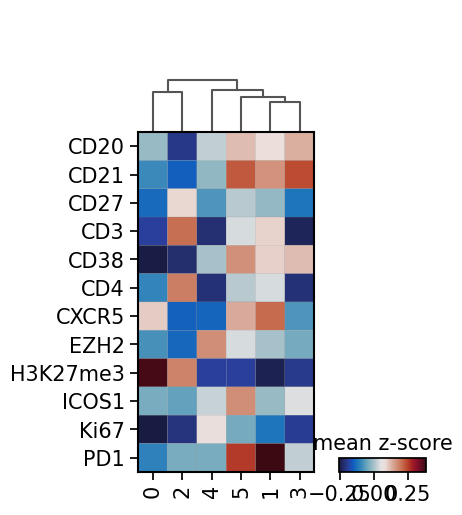

In [23]:
sc.tl.dendrogram(adata_CN, groupby='CN')

sns.set_context("notebook", font_scale=1.5)
sc.pl.matrixplot(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "CN",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap=heatmap_cmp,
    swap_axes=True,
    use_raw=True,
    # vmin=0,
    # vmax=0.3
)

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


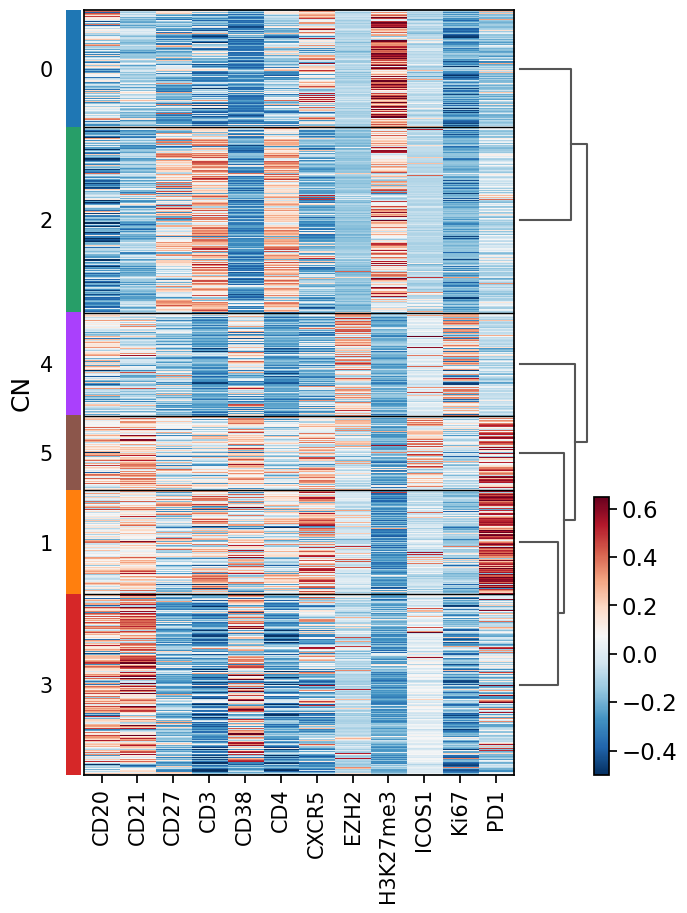

In [24]:
sc.pl.heatmap(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "CN",
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
    vmin=-0.5,
    vmax=0.65
)

In [25]:
cluster_label_order = adata_CN.uns['dendrogram_CN']['categories_ordered']

In [26]:
import matplotlib 

colors = adata_CN.uns["CN_colors"]
labels = adata_CN.obs.CN.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

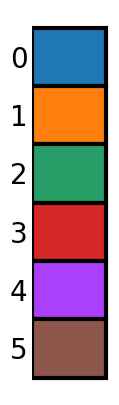

In [27]:
# legend
fig, ax = plt.subplots(figsize=(1,5))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=np.array(list(colors_rgb_dict.values()))/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), colors_rgb_dict.keys(), rotation=0, size=20)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


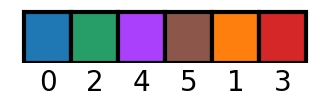

In [28]:
# legend
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

fig, ax = plt.subplots(figsize=(4,0.7))
ax.bar(x=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.xticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=20)
_ = plt.yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.grid(False)


# Plot cell mask

In [29]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [30]:
experiment='tonsil'

In [31]:
masks = get_masks(data_dir / "masks", f"{experiment}")

In [32]:
colors = adata_CN.uns["CN_colors"]
labels = np.unique(adata_CN.obs.CN.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

  0%|          | 0/6 [00:00<?, ?it/s]

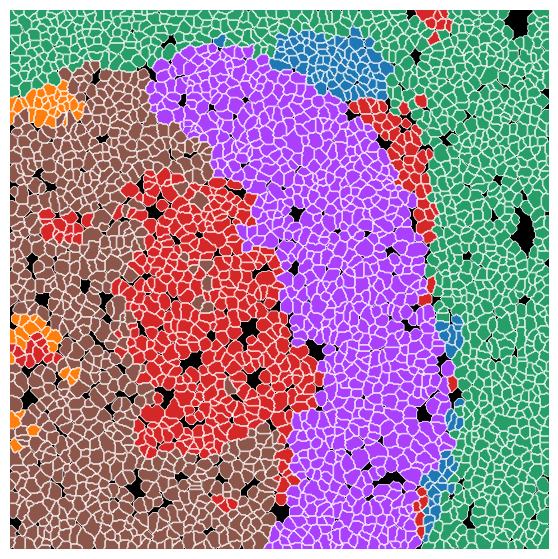

  0%|          | 0/6 [00:00<?, ?it/s]

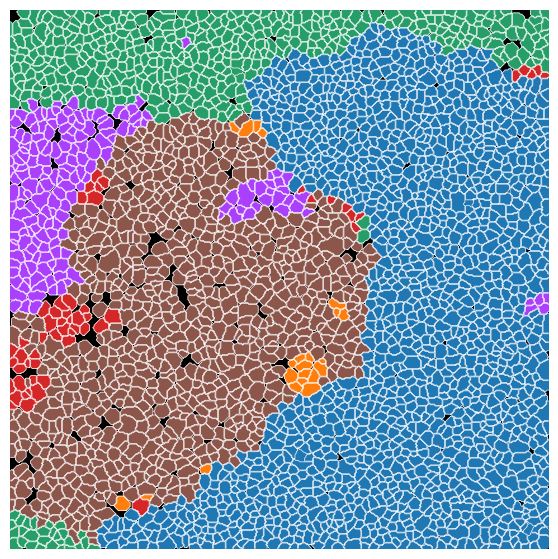

  0%|          | 0/6 [00:00<?, ?it/s]

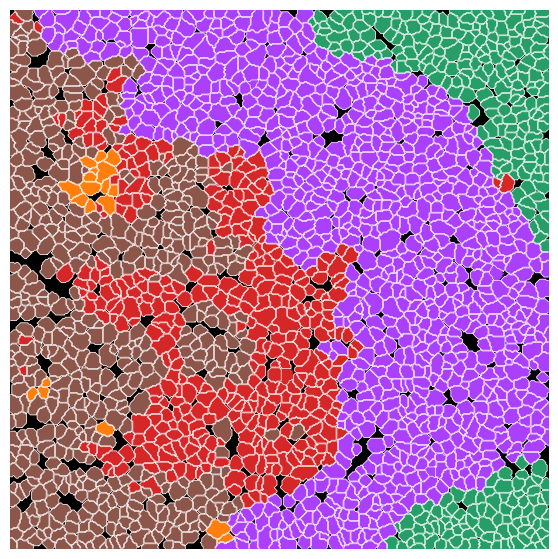

  0%|          | 0/6 [00:00<?, ?it/s]

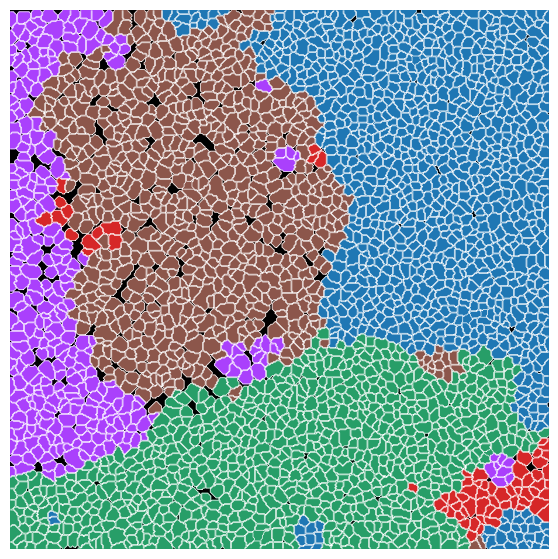

  0%|          | 0/6 [00:00<?, ?it/s]

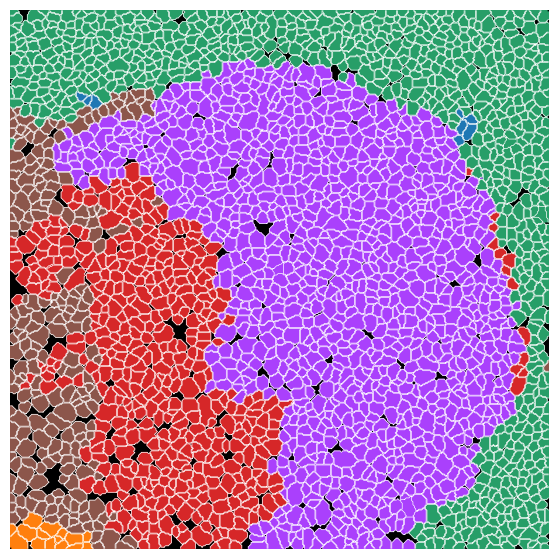

  0%|          | 0/6 [00:00<?, ?it/s]

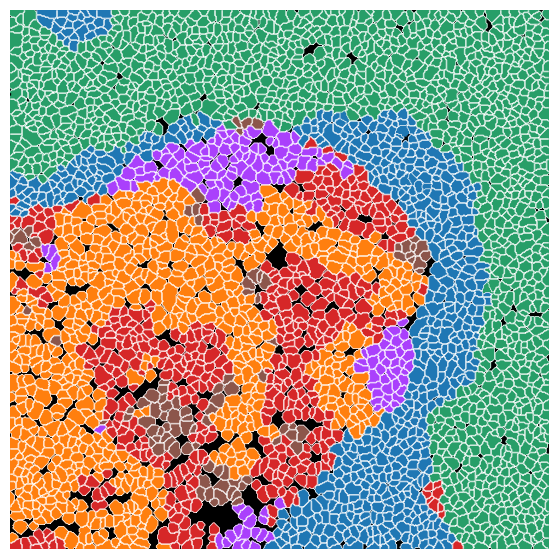

  0%|          | 0/6 [00:00<?, ?it/s]

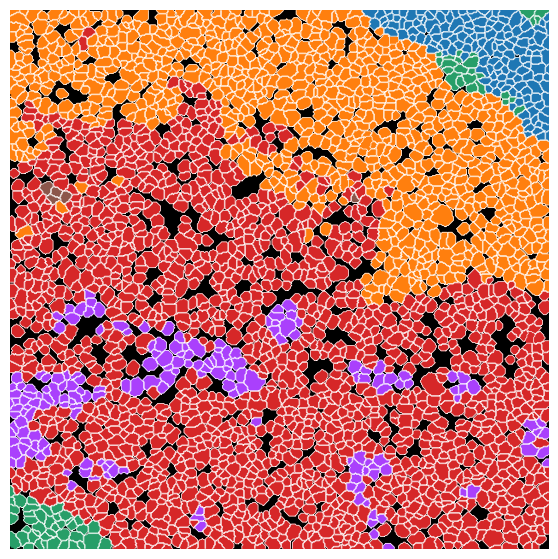

  0%|          | 0/6 [00:00<?, ?it/s]

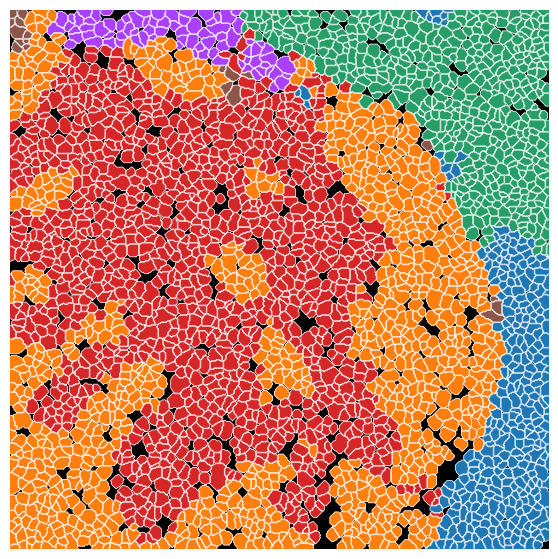

  0%|          | 0/6 [00:00<?, ?it/s]

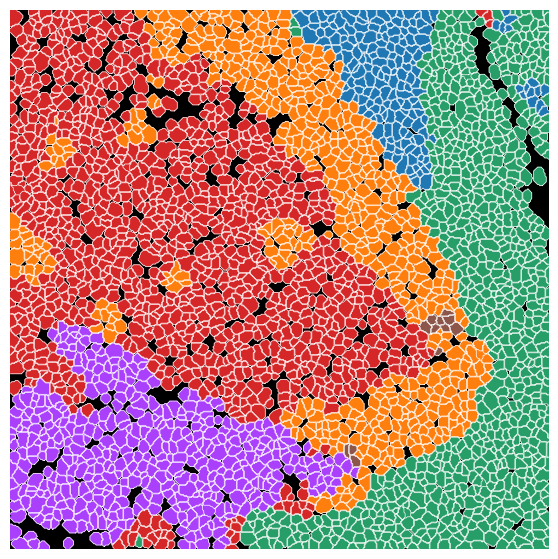

  0%|          | 0/6 [00:00<?, ?it/s]

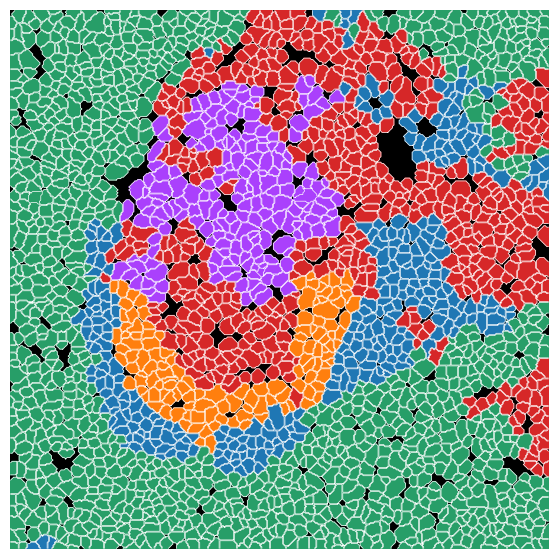

  0%|          | 0/6 [00:00<?, ?it/s]

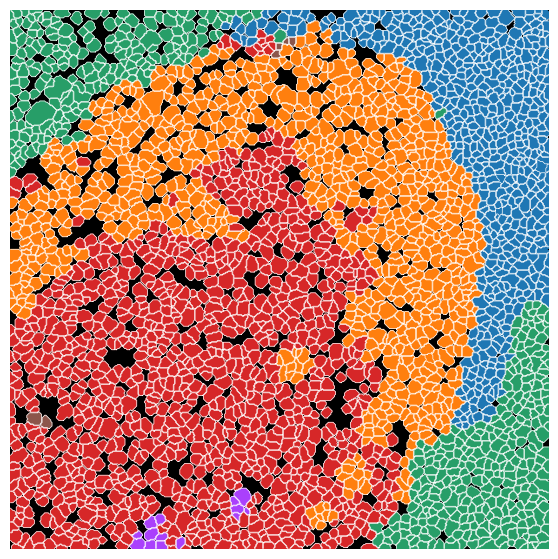

In [33]:
for dataset in adata_CN.obs['Core'].unique():
    adata_fov = adata_CN[adata_CN.obs['Core'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.CN == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()


# Name zone

In [34]:
type_dict = {0: 'Follicle Zone',
            1: 'GC Light Zone',
            2: 'Outside Follicle', 
            3: 'GC Light Zone',
            4: 'GC Dark Zone',
            5: 'GC Light Zone'
            }

In [35]:
adata_CN.obs['Type'] = (
    adata_CN.obs['CN']
    .map(type_dict)
    .astype("category")
)
adata_CN.uns['Type_colors'] = adata_CN.uns['CN_colors'][:len(np.unique(adata_CN.obs['Type']))]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Type']`


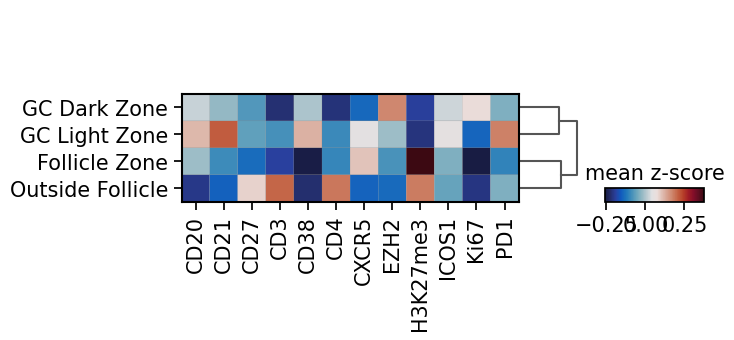

In [36]:
sc.tl.dendrogram(adata_CN, groupby='Type')

sc.pl.matrixplot(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "Type",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap=heatmap_cmp,
    swap_axes=False,
    # vmin=-0.25,
    # vmax=0.5
)

In [37]:
cluster_label_order = adata_CN.uns['dendrogram_Type']['categories_ordered']

In [38]:
import matplotlib 

colors = adata_CN.uns["Type_colors"]
labels = adata_CN.obs.Type.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

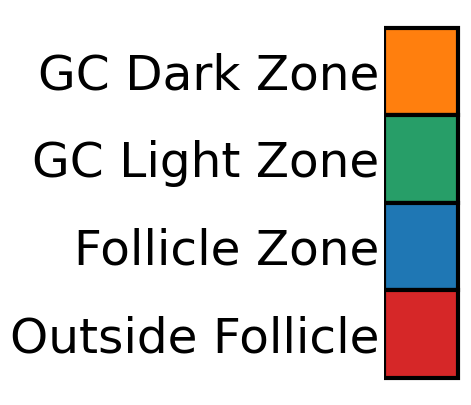

In [39]:
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

# legend
fig, ax = plt.subplots(figsize=(1,5))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=35)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


In [40]:
colors = adata_CN.uns["Type_colors"]
labels = np.unique(adata_CN.obs.Type.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

  0%|          | 0/4 [00:00<?, ?it/s]

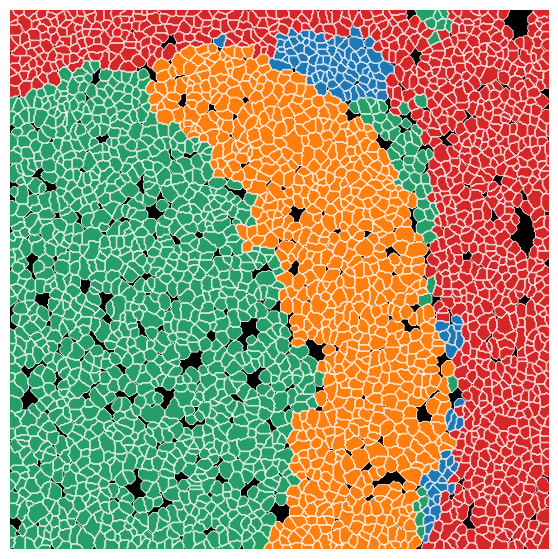

  0%|          | 0/4 [00:00<?, ?it/s]

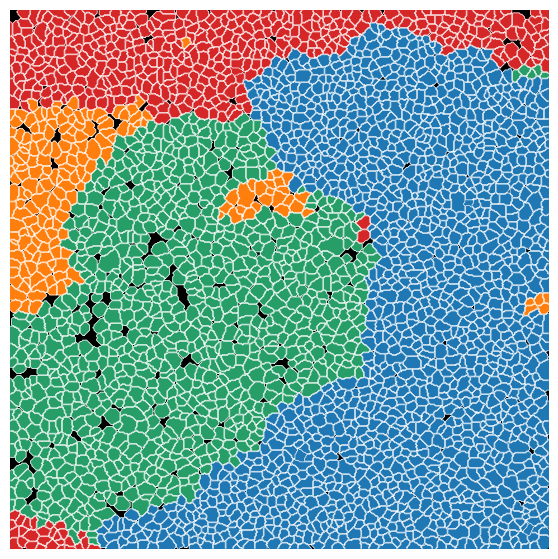

  0%|          | 0/4 [00:00<?, ?it/s]

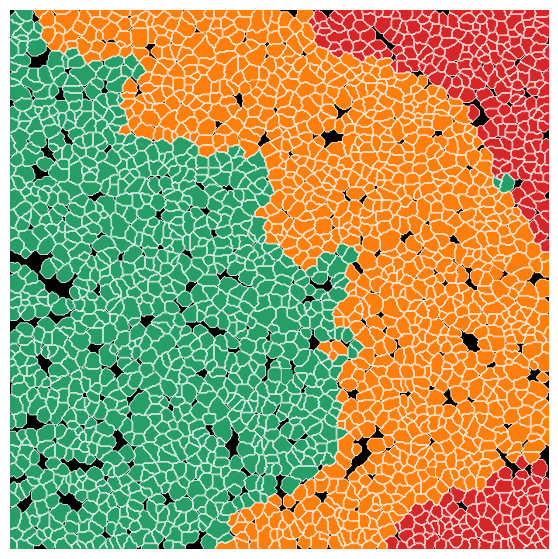

  0%|          | 0/4 [00:00<?, ?it/s]

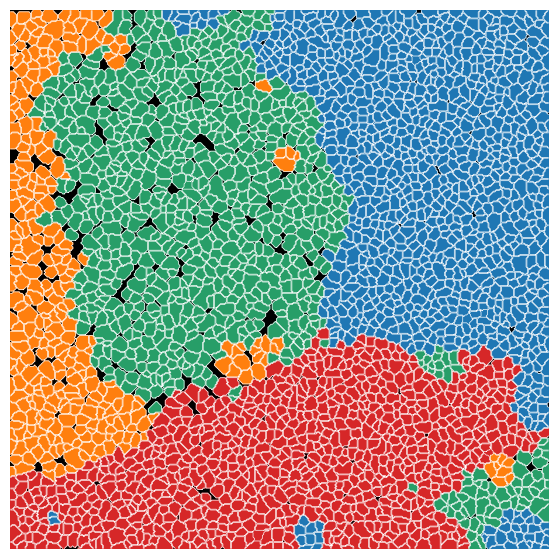

  0%|          | 0/4 [00:00<?, ?it/s]

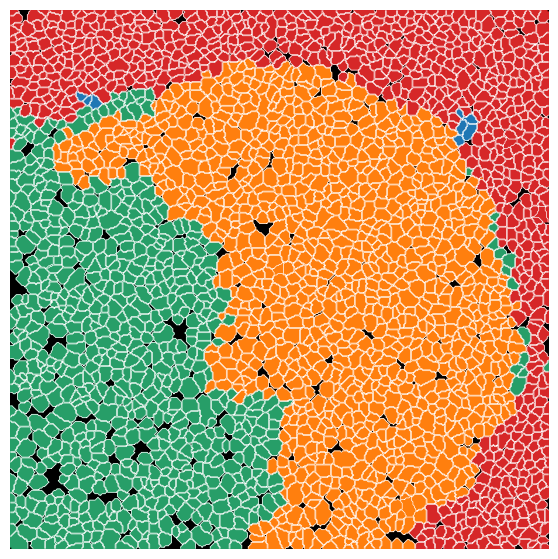

  0%|          | 0/4 [00:00<?, ?it/s]

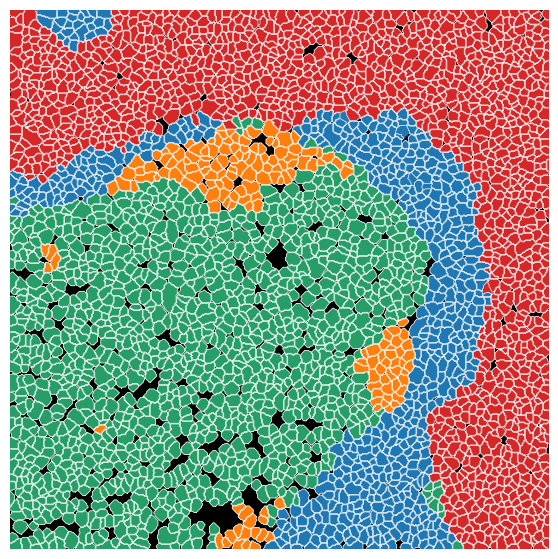

  0%|          | 0/4 [00:00<?, ?it/s]

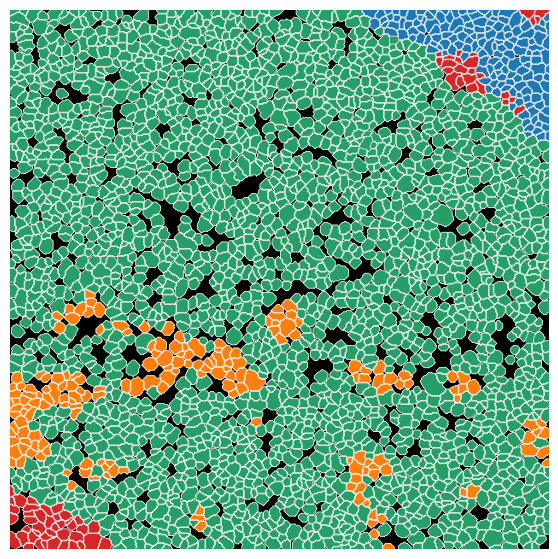

  0%|          | 0/4 [00:00<?, ?it/s]

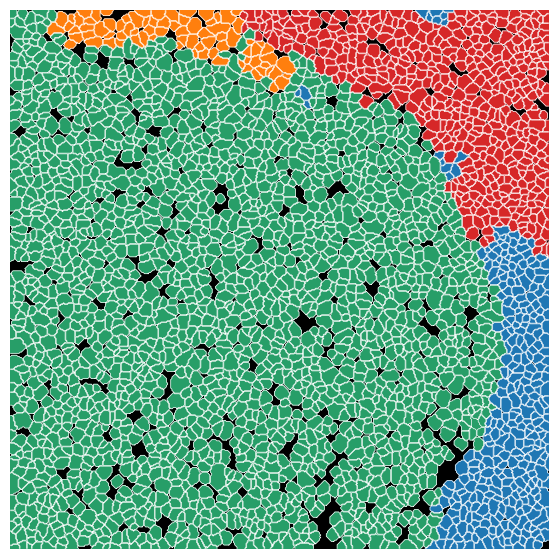

  0%|          | 0/4 [00:00<?, ?it/s]

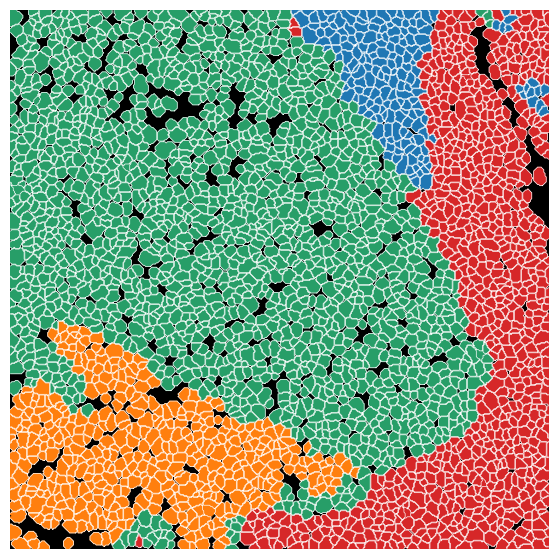

  0%|          | 0/4 [00:00<?, ?it/s]

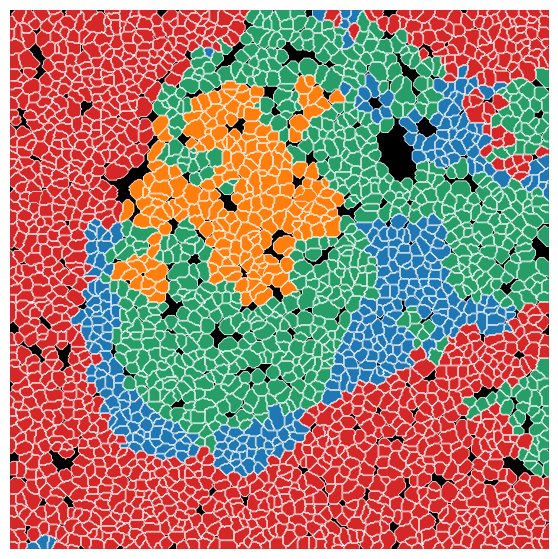

  0%|          | 0/4 [00:00<?, ?it/s]

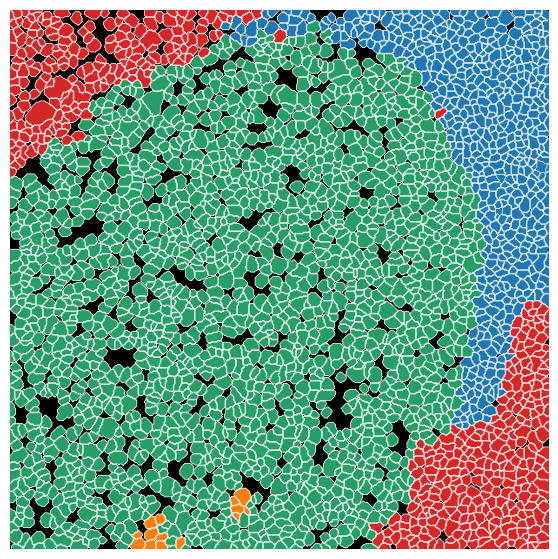

In [41]:
for dataset in adata_CN.obs['Core'].unique():
    adata_fov = adata_CN[adata_CN.obs['Core'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.Type == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()


# Name Region

In [42]:
type_dict = {0: 'Outside GC',
            1: 'GC',
            2: 'Outside GC', 
            3: 'GC',
            4: 'GC',
            5: 'GC'
            }

In [43]:
adata_CN.obs['Region'] = (
    adata_CN.obs['CN']
    .map(type_dict)
    .astype("category")
)
adata_CN.uns['Region_colors'] = adata_CN.uns['CN_colors'][:len(np.unique(adata_CN.obs['Region']))]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region']`


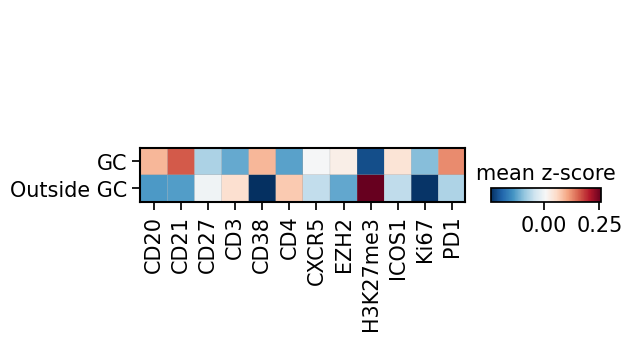

In [44]:
sc.tl.dendrogram(adata_CN, groupby='Region')

sc.pl.matrixplot(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "Region",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
    swap_axes=False,
    # vmin=-0.25,
    # vmax=0.5
)

In [45]:
cluster_label_order = adata_CN.uns['dendrogram_Region']['categories_ordered']

In [46]:
import matplotlib 

colors = adata_CN.uns["Region_colors"]
labels = adata_CN.obs.Region.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

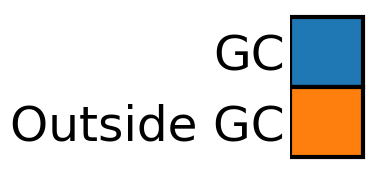

In [47]:
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

# legend
fig, ax = plt.subplots(figsize=(1,2))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=35)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


In [48]:
colors = adata_CN.uns["Region_colors"]
labels = np.unique(adata_CN.obs.Region.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

  0%|          | 0/2 [00:00<?, ?it/s]

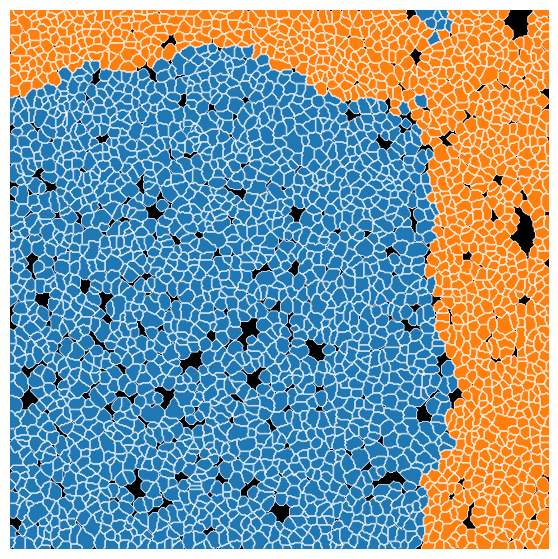

  0%|          | 0/2 [00:00<?, ?it/s]

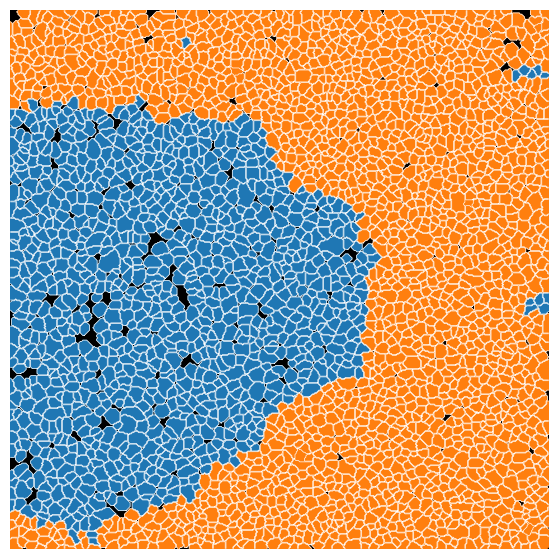

  0%|          | 0/2 [00:00<?, ?it/s]

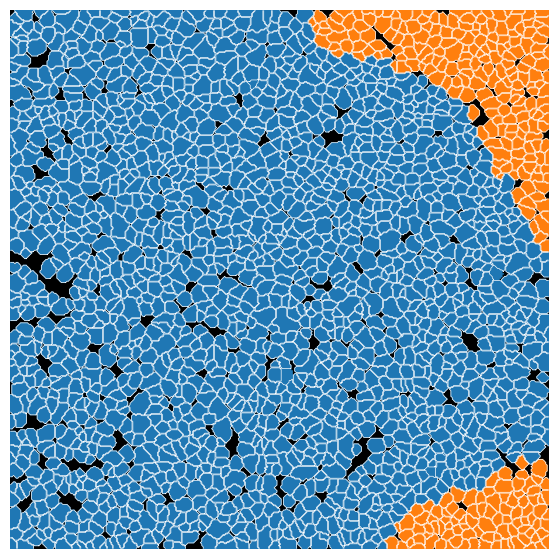

  0%|          | 0/2 [00:00<?, ?it/s]

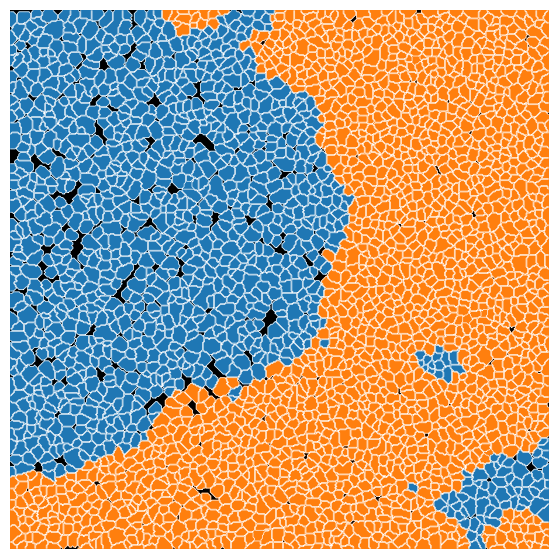

  0%|          | 0/2 [00:00<?, ?it/s]

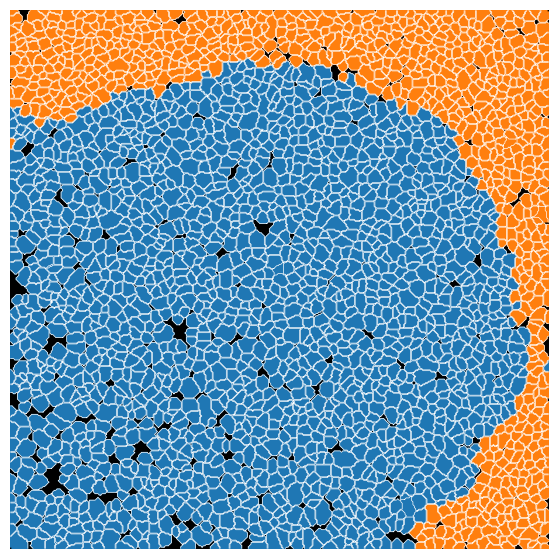

  0%|          | 0/2 [00:00<?, ?it/s]

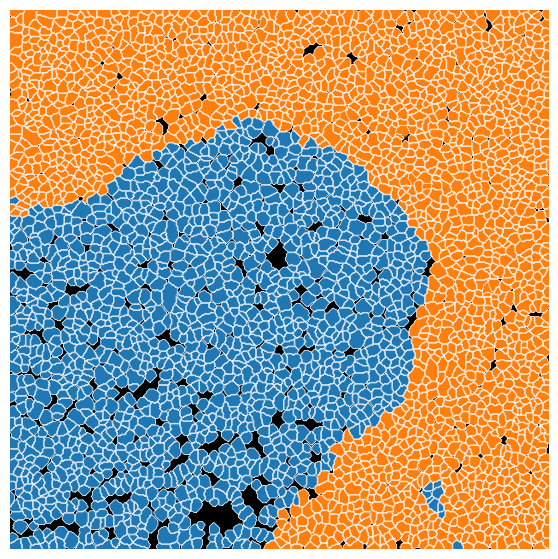

  0%|          | 0/2 [00:00<?, ?it/s]

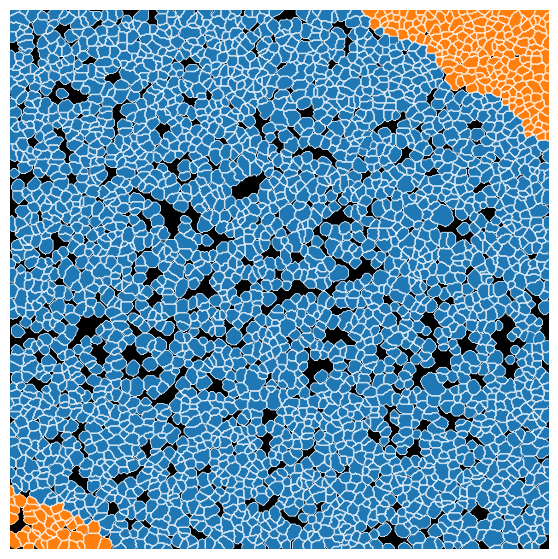

  0%|          | 0/2 [00:00<?, ?it/s]

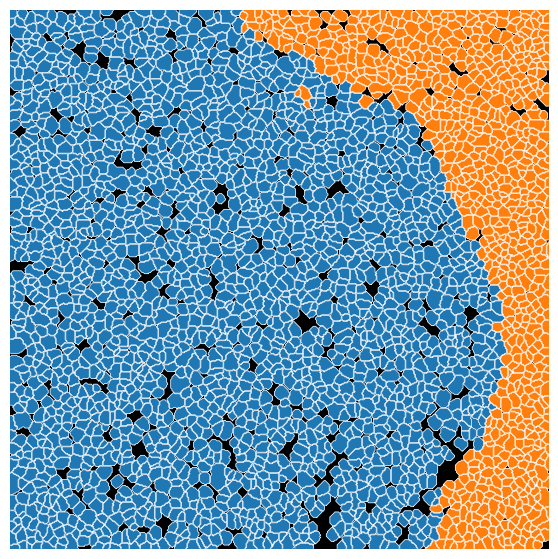

  0%|          | 0/2 [00:00<?, ?it/s]

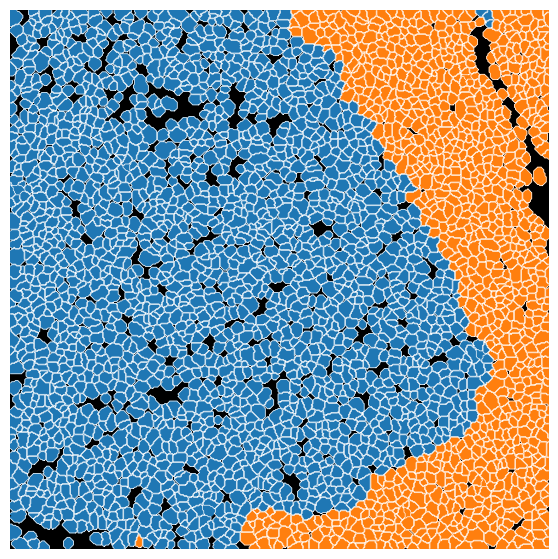

  0%|          | 0/2 [00:00<?, ?it/s]

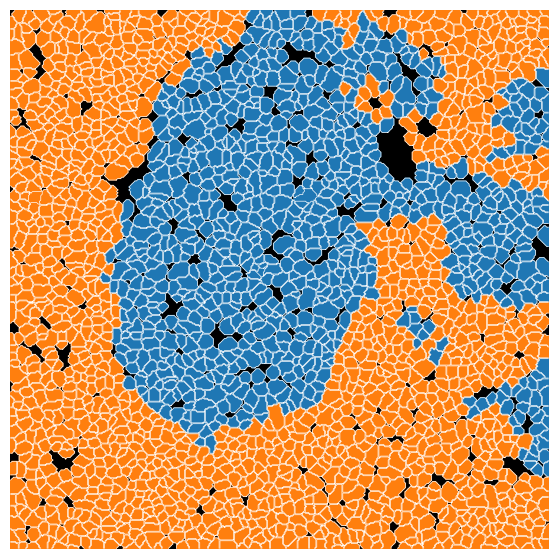

  0%|          | 0/2 [00:00<?, ?it/s]

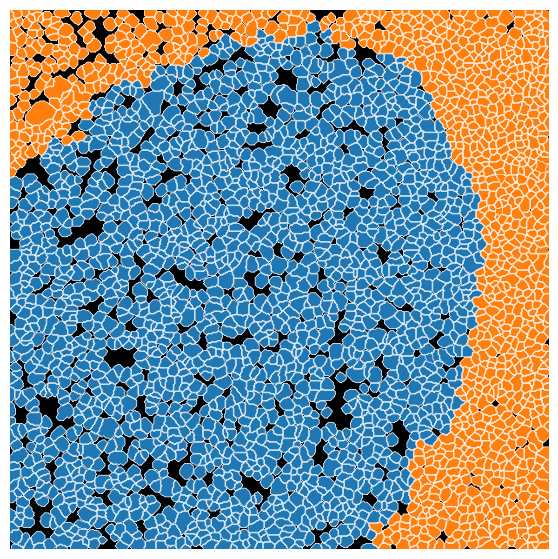

In [49]:
experiment = 'tonsil'

for dataset in adata_CN.obs['Core'].unique():
    adata_fov = adata_CN[adata_CN.obs['Core'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.Region == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()


## Create GC mask

In [50]:
from skimage import morphology
import scipy.ndimage

def create_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols] = i+1

    return img

def save_mask(mask, folder, region):
    path = os.path.join(folder, f"{region}" + ".tif")
    skimage.io.imsave(path, mask)

In [51]:
for dataset in adata_CN.obs['Core'].unique():
    adata_fov = adata_CN[adata_CN.obs['Core'] == dataset]
    try:
        mask = masks["_".join([experiment, dataset])]
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.Region == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_cell(mask, label2cell, colors_rgb)
    mask_gc = img == 1
    mask_gc = morphology.remove_small_objects(mask_gc, 5000)
    mask_gc = morphology.remove_small_holes(mask_gc, 1000)
    
    save_mask(mask_gc, data_dir / "mask_border", f"{experiment}_{dataset}")

  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorA_1.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorA_2.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorA_3.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorA_4.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorA_5.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_1.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_2.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_3.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_4.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_5.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\2883022103.py:15: UserWarning: Y:\coskun-lab\Thomas\ScSpaMet\data\mask_border\tonsil_DonorE_6.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skimage.io.imsave(path, mask)


# Save data

In [52]:
# # Read Protein clustering info
# path = data_dir / "adata" / f"{experiment}_GC_CN.h5ad"
# adata_CN.write_h5ad(path)


# Get SIMS data

In [58]:
adata.obs['CN'] = adata_CN.obs['CN'].astype(str).astype('category')
adata.uns["CN_colors"] = adata_CN.uns["CN_colors"]
adata.obs["Type"] = adata_CN.obs["Type"]
adata.uns["Type_colors"] = adata_CN.uns["Type_colors"]
adata.obs["Region"] = adata_CN.obs["Region"]
adata.uns["Region_colors"] = adata_CN.uns["Region_colors"]
adata.obsm["spatial"] = adata_CN.obsm["spatial"]

## Groupby cell type

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
Storing dendrogram info using `.uns['dendrogram_CN']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.l

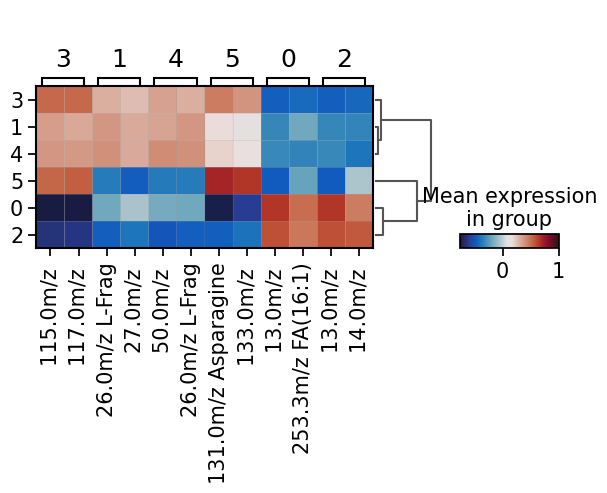

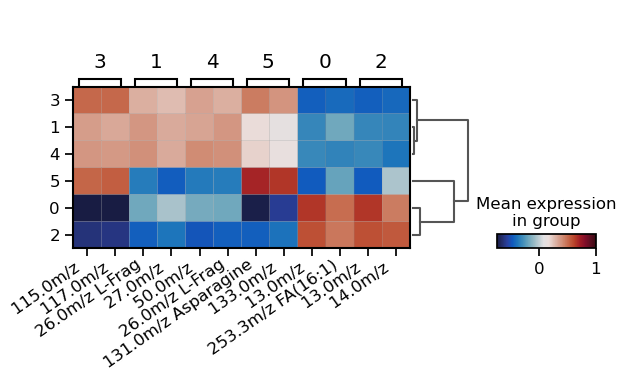

In [59]:
sc.tl.dendrogram(adata, groupby='CN')
sc.tl.rank_genes_groups(adata, groupby='CN', method='wilcoxon')

with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=2, use_raw=False, cmap=heatmap_cmp, vmax=1, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [75]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=3
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

In [76]:
# Extract dataframe
var = 'CN'

adata_subset = adata[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

In [77]:
# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))
df = df_SIMS_var[df_SIMS_var[var] == '1'].groupby('mz').mean()
df.sort_values('Normalized ion count', inplace=True)
masses_sorted = df.index.tolist()

C:\Users\thu71\AppData\Local\Temp\ipykernel_33476\1442678157.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df_SIMS_var[df_SIMS_var[var] == '1'].groupby('mz').mean()


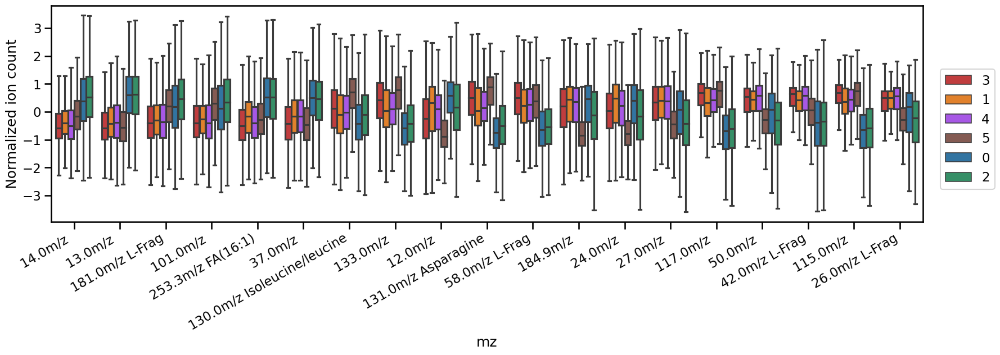

In [78]:
sns.set_context('talk', font_scale=1)

hue_order = adata_subset.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_subset.uns[f'{var}_colors'][adata_subset.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=df_SIMS_var, 
            hue=var, 
            x='mz', 
            y='Normalized ion count',
            order=masses_sorted,
            hue_order = hue_order,
            ax=ax, 
            palette=palette, 
            showfliers=False)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)




C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


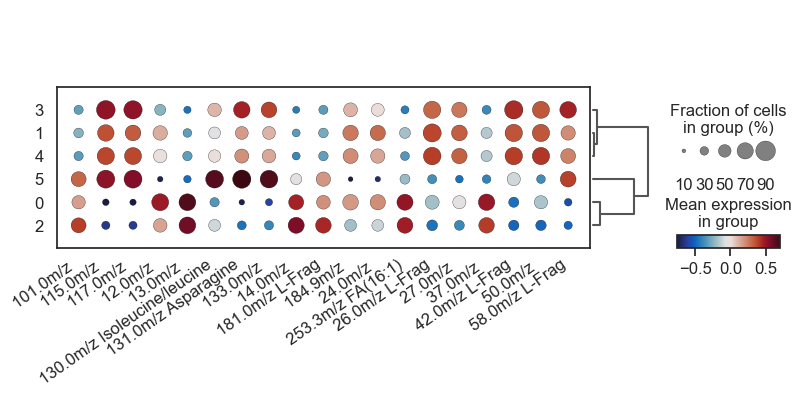

In [80]:
sns.set_style('white')
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata, var_names=masses, groupby=var,
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

## Groupby Region

In [ ]:
sc.tl.dendrogram(adata, groupby='Region')
sc.tl.rank_genes_groups(adata, groupby='Region', method='wilcoxon')
                        
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=7, use_raw=False, cmap=heatmap_cmp, vmax=1, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [ ]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=15
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

In [ ]:
# Extract dataframe
var = 'Region'

adata_subset = adata[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

In [ ]:
# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))
df = df_SIMS_var[df_SIMS_var.Region == 'GC'].groupby('mz').mean()
df.sort_values('Normalized ion count', inplace=True)
masses_sorted = df.index.tolist()

In [ ]:
sns.set_context('talk', font_scale=1)

hue_order = adata_subset.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_subset.uns[f'{var}_colors'][adata_subset.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=df_SIMS_var, 
            hue=var, 
            x='mz', 
            y='Normalized ion count',
            order=masses_sorted,
            hue_order = hue_order,
            ax=ax, 
            palette=palette, 
            showfliers=False)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)




In [ ]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata, var_names=masses, groupby='Region',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

### Plot by mz channel

In [ ]:
import palettable
h5_data_dir = p_dir / "data" / "h5"
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

from typing import List
import matplotlib
import skimage
from skimage import measure

h5_data_dir = p_dir / "data" / "h5"

# Read mask image
def get_masks(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, cell2count,  **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]))*np.nan

    for cell, counts in tqdm(cell2count.items(), total=len(cell2count)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = counts

    return img

def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mz_img, cmap='rainbow', interpolation='quadric', vmin=0, vmax=np.percentile(mz_img, 90))  
    ax.axis('off')
    plt.title(f'{mz} m/z')
    plt.show()
    return mz_img 

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    # fig, ax = plt.subplots(figsize=(7,7))
    # ax.imshow(mz_img, cmap=heatmap_cmp, interpolation='quadric', vmin=0,vmax=np.percentile(mz_img, 99))  
    # ax.axis('off')
    # plt.title(f'{mz} m/z')
    # plt.show()
    return mz_img 

In [ ]:
masks = get_masks(data_dir / "masks")
experiment='tonsil'

In [ ]:
dataset = 'DonorE_2'

mask = masks[experiment + '_' + dataset]
contours = get_contour(mask)

adata_fov = adata[adata.obs['Dataset'] == dataset]

fig, axs = plt.subplots(4,4,figsize=(20, 22), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[:16]):
    ax = axs[i]
    
    adata_subset = adata_fov[:, channel]
    # Get label2cell dict
    cells = adata_subset.obs['Cell'].to_list()
    counts = adata_subset.X.flatten()
    cell2count = dict(zip(cells, counts))

    img = create_clustered_cell(mask, cell2count)

    ax.imshow(img, cmap='bwr', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
    ax.set_title(f"{channel.split('m/z')[0]}", size=20, c='w')
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.1)
plt.show()

In [ ]:
imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)

fig, axs = plt.subplots(4,4,figsize=(20, 22), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[:16]):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    
    ax.imshow(mz_img, cmap=heatmap_cmp, interpolation=None, vmin=0, vmax=np.percentile(mz_img, 95))
    ax.set_title(mz, size=20, c='w')
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.1)
plt.show()


### Groupby Type

In [ ]:
sc.tl.dendrogram(adata, groupby='Type')
sc.tl.rank_genes_groups(adata, groupby='Type', method='wilcoxon')

with sns.plotting_context('notebook', font_scale=1.0):
    ax = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, use_raw=False, cmap=heatmap_cmp, vmax=1, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [ ]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=10
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

In [ ]:
# Extract dataframe
var = 'Type'

adata_subset = adata[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

In [ ]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata, var_names=masses, groupby='Type',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [ ]:
g = sns.clustermap(df_SIMS_grouped,
                   cmap=heatmap_cmp, 
                   row_cluster=True,
                   col_cluster=True,
                   cbar_pos=(.0, .32, .02, .2), 
                   dendrogram_ratio=(.1, .1), 
                   figsize=(15, 4), 
                   yticklabels=True, 
                   xticklabels=True, 
                   linewidths=.75,
                   square=True,
                   # vmax=2.5,
                   # vmin=-2.5
                  )
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center')
g.ax_row_dendrogram.set_visible(False)



In [ ]:
# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

# Sort masses by GC eexpression
# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))
df = df_SIMS_var[df_SIMS_var.Type == 'GC Light Zone'].groupby('mz').mean()
df.sort_values('Normalized ion count', inplace=True)
masses_sorted = df.index.tolist()

In [ ]:
sns.set_context('talk', font_scale=1)

df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

hue_order = adata_subset.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_subset.uns[f'{var}_colors'][adata_subset.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=df_SIMS_var, 
            hue=var, 
            x='mz', 
            y='Normalized ion count',
            order=masses_sorted,
            hue_order = hue_order,
            ax=ax, 
            palette=palette, 
            showfliers=False)
plt.xticks(rotation = 35, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)




In [ ]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=10
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))
print(len(masses))

In [ ]:
dataset = 'DonorE_4'

mask = masks[experiment + '_' + dataset]
contours = get_contour(mask)

adata_fov = adata[adata.obs['Dataset'] == dataset]

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[::2][:16]):
    ax = axs[i]
    
    adata_subset = adata_fov[:, channel]
    # Get label2cell dict
    cells = adata_subset.obs['Cell'].to_list()
    counts = adata_subset.X.flatten()
    cell2count = dict(zip(cells, counts))

    img = create_clustered_cell(mask, cell2count)

    ax.imshow(img, cmap='bwr', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
    ax.set_title(f"{channel.split('m/z')[0]}", size=40, c='w')
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.14)
plt.show()

In [ ]:
imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[::2][:16]):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    
    ax.imshow(mz_img, cmap=heatmap_cmp, interpolation=None, vmin=0, vmax=np.percentile(mz_img, 95))
    ax.set_title(mz, size=40, c='w')
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.15)
plt.show()
